# Solvers for Sustainable Performance
## Jed Brown at CSDMS 2023

## Tenets
* What is stiffness?
* Sparse direct solvers
* Preconditioned iterative methods
* Scalability and constants
* Performance and interpreting logs
  
## Test problems (hands-on)

* $p$-Bratu problem
* Compressible viscous flow
* Hyperelasticity

## This repository
* https://github.com/jedbrown/csdms23-solvers

## Resources
* https://petsc.org
* https://libceed.org
* https://ratel.micromorph.org
* https://cu-numpde.github.io/fall22/slides.html

# Experimentation and diagnostics are crucial

## Rust compiler developer:

<blockquote class="twitter-tweet"><p lang="en" dir="ltr">&quot;compilers are error reporting tools with a code generation side gig&quot;</p>&mdash; @ekuber@hachyderm.io (@ekuber) <a href="https://twitter.com/ekuber/status/1584300366857846785?ref_src=twsrc%5Etfw">October 23, 2022</a></blockquote> <script async src="https://platform.twitter.com/widgets.js" charset="utf-8"></script> 

## Me:

> PETSc is an algebraic systems diagnostic tool with a solver side gig.

In [2]:
using LinearAlgebra
using Plots
default(linewidth=4, legendfontsize=12)

struct RKTable
    A::Matrix
    b::Vector
    c::Vector
    function RKTable(A, b)
        s = length(b)
        A = reshape(A, s, s)
        c = vec(sum(A, dims=2))
        new(A, b, c)
    end
end

function rk_stability(z, rk)
    s = length(rk.b)
    1 + z * rk.b' * ((I - z*rk.A) \ ones(s))
end

rk4 = RKTable([0 0 0 0; .5 0 0 0; 0 .5 0 0; 0 0 1 0], [1, 2, 2, 1] / 6)
heun = RKTable([0 0; 1 0], [.5, .5])
Rz_theta(z, theta) = (1 + (1 - theta)*z) / (1 - theta*z)

function ode_rk_explicit(f, u0; tfinal=1, h=0.1, table=rk4)
    u = copy(u0)
    t = 0.
    n, s = length(u), length(table.c)
    fY = zeros(n, s)
    thist = [t]
    uhist = [u0]
    while t < tfinal
        tnext = min(t+h, tfinal)
        h = tnext - t
        for i in 1:s
            ti = t + h * table.c[i]
            Yi = u + h * sum(fY[:,1:i-1] * table.A[i,1:i-1], dims=2)
            fY[:,i] = f(ti, Yi)
        end
        u += h * fY * table.b
        t = tnext
        push!(thist, t)
        push!(uhist, u)
    end
    thist, hcat(uhist...)
end

function plot_stability(Rz, method; xlim=(-3, 2), ylim=(-1.5, 1.5))
    x = xlim[1]:.02:xlim[2]
    y = ylim[1]:.02:ylim[2]
    plot(title="Stability: $method", aspect_ratio=:equal, xlim=xlim, ylim=ylim)
    heatmap!(x, y, (x, y) -> abs(Rz(x + 1im*y)), c=:bwr, clims=(0, 2))
    contour!(x, y, (x, y) -> abs(Rz(x + 1im*y)), color=:black, linewidth=2, levels=[1.])
    plot!(x->0, color=:black, linewidth=1, label=:none)
    plot!([0, 0], [ylim...], color=:black, linewidth=1, label=:none)
end

plot_stability (generic function with 1 method)

# The $\theta$ method


Forward and backward Euler are bookends of the family known as $\theta$ methods.

$$ \tilde u(h) = u(0) + h f\Big(\theta h, \theta\tilde u(h) + (1-\theta)u(0) \Big) $$

which, for linear problems, is solved as

$$ (I - h \theta A) u(h) = \Big(I + h (1-\theta) A \Big) u(0) . $$

$\theta=0$ is explicit Euler, $\theta=1$ is implicit Euler, and $\theta=1/2$ are the midpoint or trapezoid rules (equivalent for linear problems).
The stability function is
$$ R(z) = \frac{1 + (1-\theta)z}{1 - \theta z}. $$

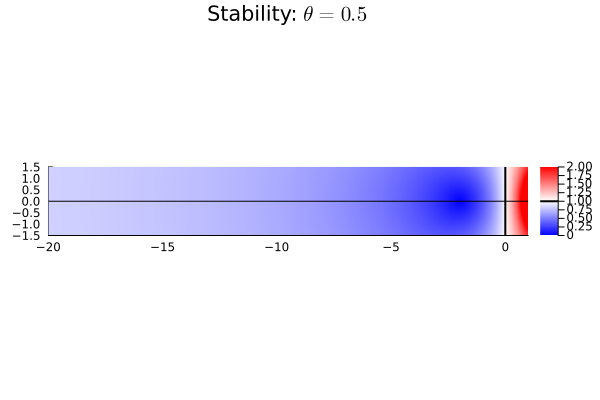

In [3]:
Rz_theta(z, theta) = (1 + (1-theta)*z) / (1 - theta*z)
theta = .5
plot_stability(z -> Rz_theta(z, theta), "\$\\theta=$theta\$", 
    xlim=(-20, 1))

# $\theta$ method for the oscillator

In [4]:
function ode_theta_linear(A, u0; forcing=zero, tfinal=1, h=0.1, theta=.5)
    u = copy(u0)
    t = 0.
    thist = [t]
    uhist = [u0]
    while t < tfinal
        tnext = min(t+h, tfinal)
        h = tnext - t
        rhs = (I + h*(1-theta)*A) * u .+ h*forcing(t+h*theta)
        u = (I - h*theta*A) \ rhs
        t = tnext
        push!(thist, t)
        push!(uhist, u)
    end
    thist, hcat(uhist...)
end

ode_theta_linear (generic function with 1 method)

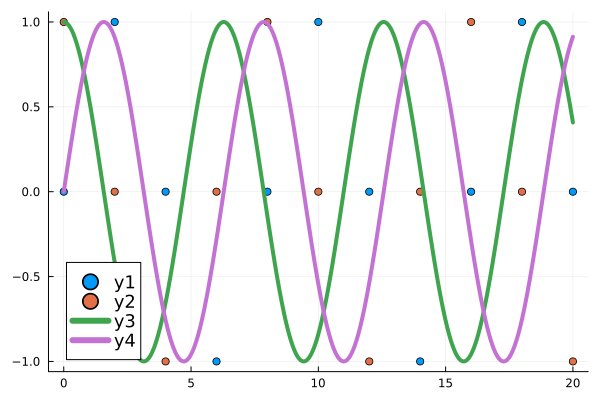

In [5]:
# Test on oscillator
A = [0 1; -1 0]
theta = .5
thist, uhist = ode_theta_linear(A, [0., 1], h=2, theta=theta, tfinal=20)
scatter(thist, uhist')
plot!([cos, sin])

# $\theta$ method for the cosine decay

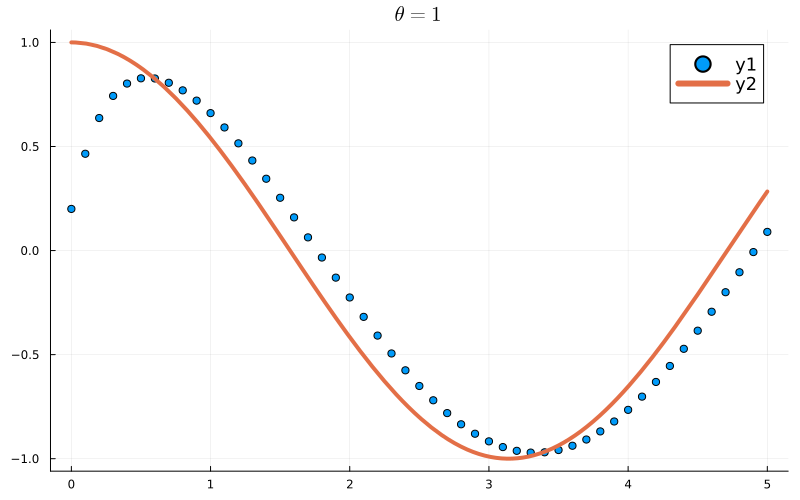

In [6]:
k = 5
theta = 1
thist, uhist = ode_theta_linear(-k, [.2], forcing=t -> k*cos(t), tfinal=5, h=.1, theta=theta)
scatter(thist, uhist[1,:], title="\$\\theta = $theta\$")
plot!(cos, size=(800, 500))

# Stability classes and the $\theta$ method


## Definition: $A$-stability
A method is $A$-stable if the stability region
$$ \{ z : |R(z)| \le 1 \} $$
contains the entire left half plane $$ \Re[z] \le 0 .$$
This means that the method can take arbitrarily large time steps without becoming unstable (diverging) for any problem that is indeed physically stable.

## Definition: $L$-stability
A time integrator with stability function $R(z)$ is $L$-stable if
$$ \lim_{z\to\infty} R(z) = 0 .$$
For the $\theta$ method, we have
$$ \lim_{z\to \infty} \frac{1 + (1-\theta)z}{1 - \theta z} = \frac{1-\theta}{\theta} . $$
Evidently only $\theta=1$ is $L$-stable.

# Heat equation as linear ODE

* How do different $\theta \in [0, 1]$ compare in terms of stability?
* Are there artifacts even when the solution is stable?

In [7]:
using SparseArrays

function heat_matrix(n)
    dx = 2 / n
    rows = [1]
    cols = [1]
    vals = [0.]
    wrap(j) = (j + n - 1) % n + 1
    for i in 1:n
        append!(rows, [i, i, i])
        append!(cols, wrap.([i-1, i, i+1]))
        append!(vals, [1, -2, 1] ./ dx^2)
    end
    sparse(rows, cols, vals)
end
heat_matrix(8)

8×8 SparseMatrixCSC{Float64, Int64} with 24 stored entries:
 -32.0   16.0     ⋅      ⋅      ⋅      ⋅      ⋅    16.0
  16.0  -32.0   16.0     ⋅      ⋅      ⋅      ⋅      ⋅ 
    ⋅    16.0  -32.0   16.0     ⋅      ⋅      ⋅      ⋅ 
    ⋅      ⋅    16.0  -32.0   16.0     ⋅      ⋅      ⋅ 
    ⋅      ⋅      ⋅    16.0  -32.0   16.0     ⋅      ⋅ 
    ⋅      ⋅      ⋅      ⋅    16.0  -32.0   16.0     ⋅ 
    ⋅      ⋅      ⋅      ⋅      ⋅    16.0  -32.0   16.0
  16.0     ⋅      ⋅      ⋅      ⋅      ⋅    16.0  -32.0

  1.890857 seconds (2.55 M allocations: 199.954 MiB, 4.13% gc time, 98.60% compilation time)


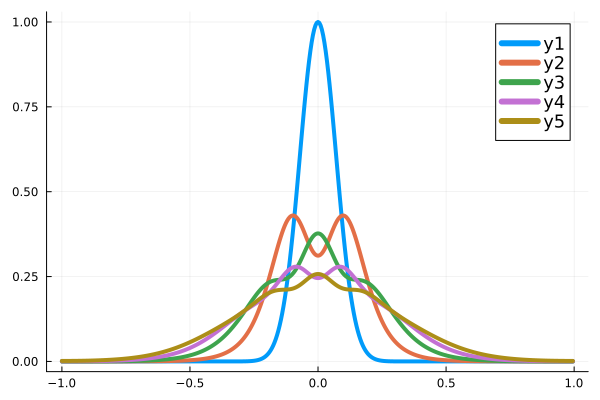

In [8]:
n = 400
A = heat_matrix(n)
x = LinRange(-1, 1, n+1)[1:end-1]
u0 = exp.(-100 * x .^ 2)
@time thist, uhist = ode_theta_linear(A, u0, h=.01, theta=.5, tfinal=1);
nsteps = size(uhist, 2)
plot(x, uhist[:, 1:5])

# Advection as a linear ODE

In [9]:
function advect_matrix(n; upwind=false)
    dx = 2 / n
    rows = [1]
    cols = [1]
    vals = [0.]
    wrap(j) = (j + n - 1) % n + 1
    for i in 1:n
        append!(rows, [i, i])
        if upwind
            append!(cols, wrap.([i-1, i]))
            append!(vals, [1., -1] ./ dx)
        else
            append!(cols, wrap.([i-1, i+1]))
            append!(vals, [1., -1] ./ 2dx)
        end
    end
    sparse(rows, cols, vals)
end
advect_matrix(5)

5×5 SparseMatrixCSC{Float64, Int64} with 11 stored entries:
  0.0   -1.25    ⋅      ⋅     1.25
  1.25    ⋅    -1.25    ⋅      ⋅ 
   ⋅     1.25    ⋅    -1.25    ⋅ 
   ⋅      ⋅     1.25    ⋅    -1.25
 -1.25    ⋅      ⋅     1.25    ⋅ 

(eigvals(Matrix(A)))[1] = -50.00000000000011 + 0.0im
  0.072182 seconds (78.07 k allocations: 5.200 MiB, 15.72% gc time, 99.25% compilation time)


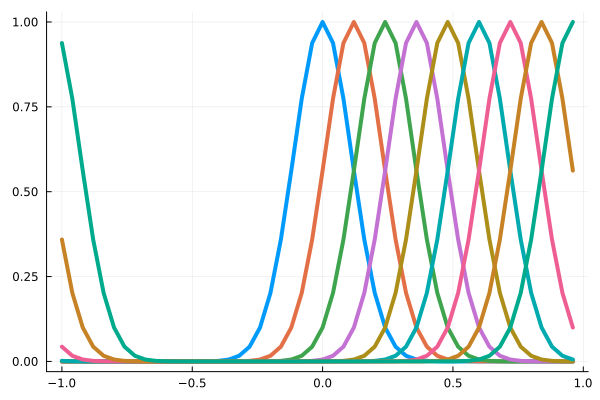

In [10]:
n = 50
A = advect_matrix(n, upwind=true)
@show eigvals(Matrix(A))[1]
x = LinRange(-1, 1, n+1)[1:end-1]
u0 = exp.(-40 * x .^ 2)
@time thist, uhist = ode_theta_linear(A, u0, h=.04, theta=0, tfinal=1.);
nsteps = size(uhist, 2)
plot(x, uhist[:, 1:(nsteps÷8):end], legend=:none)

# Spectrum of operators

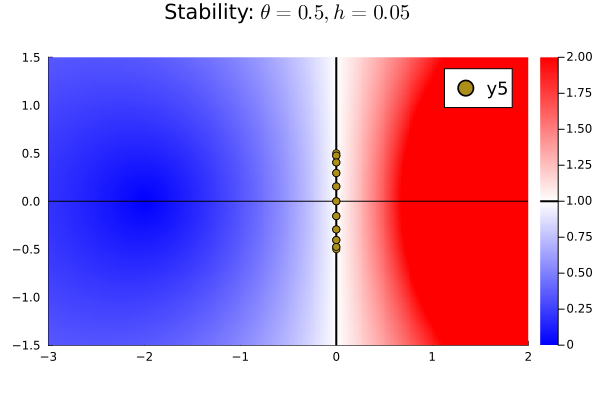

In [11]:
theta = .5
h = .05
plot_stability(z -> Rz_theta(z, theta), "\$\\theta=$theta, h=$h\$")
ev = eigvals(Matrix(h*advect_matrix(20, upwind=false)))
scatter!(real(ev), imag(ev))

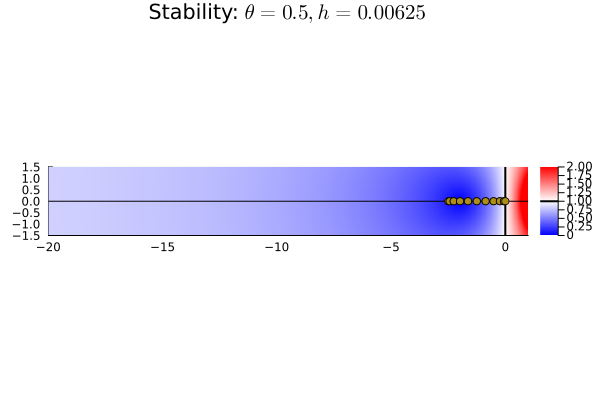

In [12]:
theta=.5
h = .2 / 32
plot_stability(z -> Rz_theta(z, theta), "\$\\theta=$theta, h=$h\$", xlim=(-20, 1))
ev = eigvals(Matrix(h*heat_matrix(20)))
scatter!(real(ev), imag(ev), legend=:none)

# Stiffness

> Stiff equations are problems for which explicit methods don’t work. (Hairer and Wanner, 2002)

* “stiff” dates to Curtiss and Hirschfelder (1952)

We'll use the cosine relaxation example $y_t = -k(y - \cos t)$ using the $\theta$ method, varying $k$ and $\theta$.

In [13]:
function ode_error(h; theta=.5, k=10)
    u0 = [.2]
    thist, uhist = ode_theta_linear(-k, u0, forcing=t -> k*cos(t), tfinal=3, h=h, theta=theta)
    T = thist[end]
    u_exact = (u0 .- k^2/(k^2+1)) * exp(-k*T) .+ k*(sin(T) + k*cos(T))/(k^2 + 1)
    uhist[1,end] .- u_exact
end

ode_error (generic function with 1 method)

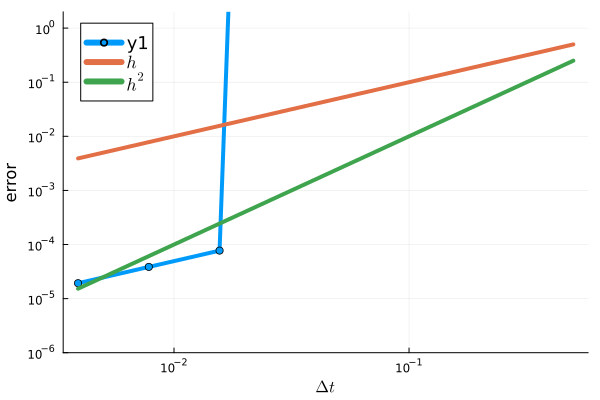

In [14]:
hs = .5 .^ (1:8)
errors = ode_error.(hs, theta=0, k=100)
plot(hs, norm.(errors), marker=:circle, xscale=:log10, yscale=:log10, ylim=(1e-6, 2))
plot!(hs, hs, label="\$h\$", legend=:topleft)
plot!(hs, hs.^2, label="\$h^2\$", ylabel="error", xlabel="\$\\Delta t\$")

# Examples of ODE systems

Stiff problems posess multiple time scales and the fastest scale is "not interesting"

## Stiff

* The ocean

## Non-stiff

* The ocean

In [15]:
using Plots
default(linewidth=3)
using LinearAlgebra
using SparseArrays

function my_spy(A)
    cmax = norm(vec(A), Inf)
    s = max(1, ceil(120 / size(A, 1)))
    spy(A, marker=(:square, s), c=:diverging_rainbow_bgymr_45_85_c67_n256, clims=(-cmax, cmax))
end

function advdiff_matrix(n; kappa=1, wind=[0, 0])
    h = 2 / (n + 1)
    rows = Vector{Int64}()
    cols = Vector{Int64}()
    vals = Vector{Float64}()
    idx((i, j),) = (i-1)*n + j
    in_domain((i, j),) = 1 <= i <= n && 1 <= j <= n
    stencil_advect = [-wind[1], -wind[2], 0, wind[1], wind[2]] / h
    stencil_diffuse = [-1, -1, 4, -1, -1] * kappa / h^2
    stencil = stencil_advect + stencil_diffuse
    for i in 1:n
        for j in 1:n
            neighbors = [(i-1, j), (i, j-1), (i, j), (i+1, j), (i, j+1)]
            mask = in_domain.(neighbors)
            append!(rows, idx.(repeat([(i,j)], 5))[mask])
            append!(cols, idx.(neighbors)[mask])
            append!(vals, stencil[mask])
        end
    end
    sparse(rows, cols, vals)
end

advdiff_matrix (generic function with 1 method)

# Gaussian elimination and Cholesky

## $LU = A$
Given a $2\times 2$ block matrix, the algorithm proceeds as
\begin{split}
  \begin{bmatrix} A & B \\ C & D \end{bmatrix} &=
  \begin{bmatrix} L_A & \\ C U_A^{-1} & 1 \end{bmatrix}
  \begin{bmatrix} U_A & L_A^{-1} B \\ & S \end{bmatrix}
\end{split}
where $L_A U_A = A$ and
$$S = D - C \underbrace{U_A^{-1} L_A^{-1}}_{A^{-1}} B .$$

## Cholesky $L L^T = A$
\begin{split}
  \begin{bmatrix} A & B^T \\ B & D \end{bmatrix} &=
  \begin{bmatrix} L_A & \\ B L_A^{-T} & 1 \end{bmatrix}
  \begin{bmatrix} L_A^T & L_A^{-1} B^T \\ & S \end{bmatrix}
\end{split}
where $L_A L_A^T = A$ and
$$ S = D - B \underbrace{L_A^{-T} L_A^{-1}}_{A^{-1}} B^T .$$

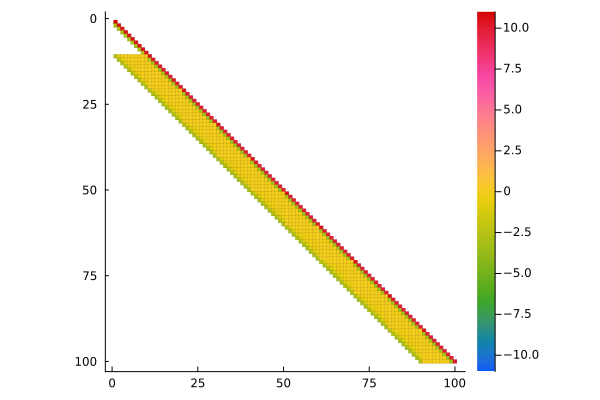

In [16]:
A = advdiff_matrix(10)
N = size(A, 1)
ch = cholesky(A, perm=1:N)
my_spy(A)
my_spy(sparse(ch.L))

# Cost of a banded solve

Consider an $N\times N$ matrix with bandwidth $b$, $1 \le b \le N$.

* Work one row at a time
* Each row/column of panel has $b$ nonzeros
* Schur update affects $b\times b$ sub-matrix
* Total compute cost $N b^2$
* Storage cost $N b$

## Question
* What bandwidth $b$ is needed for an $N = n\times n \times n$ cube in 3 dimensions?
* What is the memory cost?
* What is the compute cost?

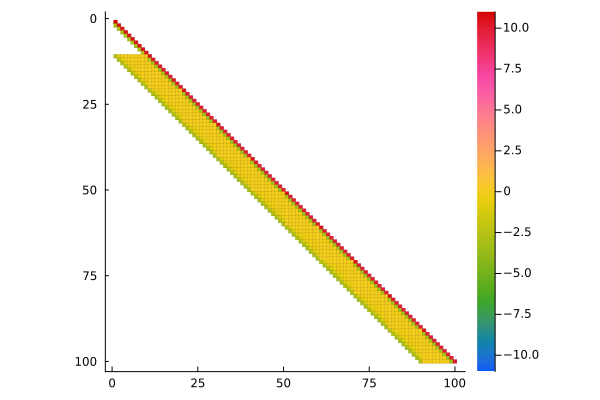

In [17]:
my_spy(sparse(ch.L))

# Different orderings

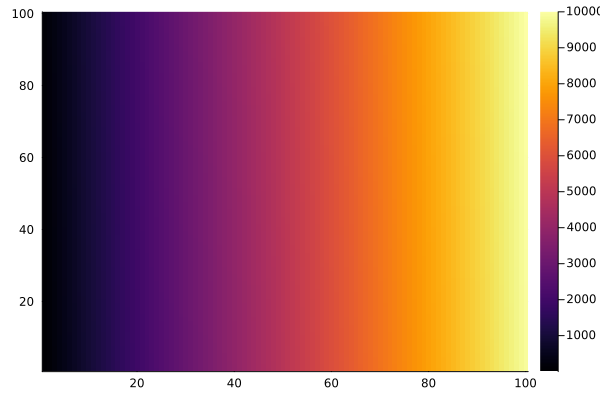

In [30]:
n = 100
A = advdiff_matrix(n)
heatmap(reshape(1:n^2, n, n))

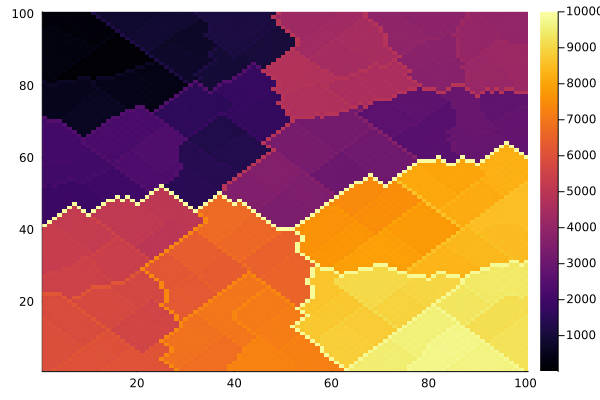

In [31]:
import Metis
perm, iperm = Metis.permutation(A)
heatmap(reshape(iperm, n, n))

In [32]:
cholesky(A, perm=1:n^2)
#my_spy(A[perm, perm])

SparseArrays.CHOLMOD.Factor{Float64}
type:    LLt
method:  supernodal
maxnnz:  0
nnz:     1109473
success: true


In [33]:
ch = cholesky(A, perm=Vector{Int64}(perm))
#my_spy(sparse(ch.L))

SparseArrays.CHOLMOD.Factor{Float64}
type:    LLt
method:  supernodal
maxnnz:  0
nnz:     224791
success: true


# Cholesky factors in nested dissection

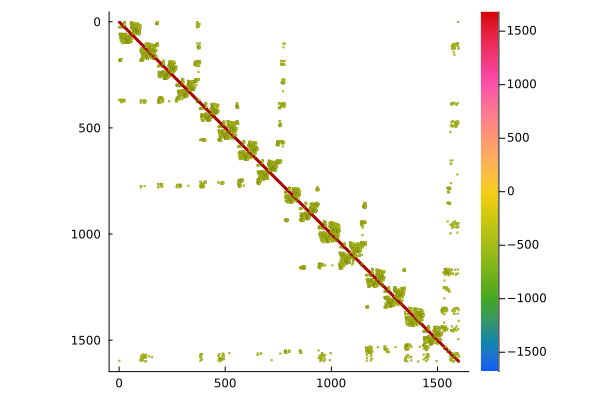

In [34]:
n = 40
A = advdiff_matrix(n)
perm, iperm = Metis.permutation(A)
my_spy(A[perm, perm])

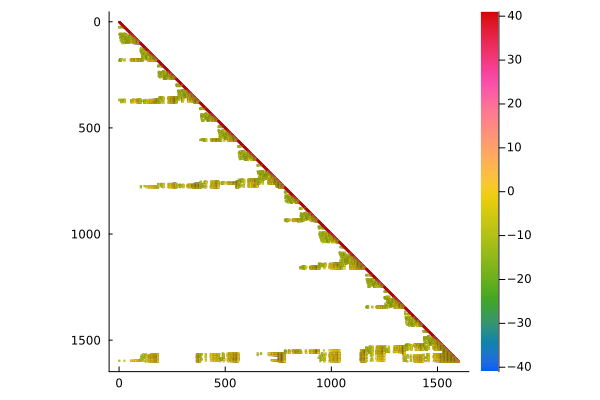

In [35]:
ch = cholesky(A, perm=Vector{Int64}(perm))
my_spy(sparse(ch.L))

* The dense blocks in factor $L$ are "supernodes"
* They correspond to "vertex separators" in the ordering

# Cost in nested dissection

* Cost is dominated by dense factorization of the largest supernode
* Its size comes from the vertex separator size

## 2D square

* $N = n^2$ dofs
* Vertex separator of size $n$
* Compute cost $v^3 = N^{3/2}$
* Storage cost $N \log N$

## 3D Cube

* $N = n^3$ dofs
* Vertex separator of size $v = n^2$
* Compute cost $v^3 = n^6 = N^2$
* Storage cost $v^2 = n^4 = N^{4/3}$

## Questions

1. How much does the cost change if we switch from Dirichlet to periodic boundary conditions in 2D?
2. How much does the cost change if we move from 5-point stencil ($O(h^2)$ accuracy) to 9-point "star" stencil ($O(h^4)$ accuracy)?
3. Would you rather solve a 3D problem on a $10\times 10\times 10000$ grid or $100\times 100 \times 100$?

# Test our intuition

In [36]:
function laplacian_matrix(n)
    h = 2 / n
    rows = Vector{Int64}()
    cols = Vector{Int64}()
    vals = Vector{Float64}()
    wrap(i) = (i + n - 1) % n + 1
    idx(i, j) = (wrap(i)-1)*n + wrap(j)
    stencil_diffuse = [-1, -1, 4, -1, -1] / h^2
    for i in 1:n
        for j in 1:n
            append!(rows, repeat([idx(i,j)], 5))
            append!(cols, [idx(i-1,j), idx(i,j-1), idx(i,j), idx(i+1,j), idx(i,j+1)])
            append!(vals, stencil_diffuse)
        end
    end
    sparse(rows, cols, vals)
end

laplacian_matrix (generic function with 1 method)

In [37]:
n = 50
A_dirichlet = advdiff_matrix(n)
perm, iperm = Metis.permutation(A_dirichlet)
cholesky(A_dirichlet, perm=Vector{Int64}(perm))
#cholesky(A_dirichlet)

SparseArrays.CHOLMOD.Factor{Float64}
type:    LLt
method:  simplicial
maxnnz:  40203
nnz:     40203
success: true


In [38]:
A_periodic = laplacian_matrix(n) + 1e-10*I
perm, iperm = Metis.permutation(A_periodic)
cholesky(A_periodic, perm=Vector{Int64}(perm))
#cholesky(A_periodic)

SparseArrays.CHOLMOD.Factor{Float64}
type:    LLt
method:  supernodal
maxnnz:  0
nnz:     60083
success: true


# How expensive how fast?

Suppose we have a second order accurate method in 3D.

In [39]:
n = 2. .^ (2:13)
N = n.^3
error = (50 ./ n) .^ 2
seconds = 1e-10 * N.^2
hours = seconds / 3600
cloud_dollars = 3 * hours
kW_hours = 0.2 * hours
barrel_of_oil = kW_hours / 1700
kg_CO2 = kW_hours * 0.709
;

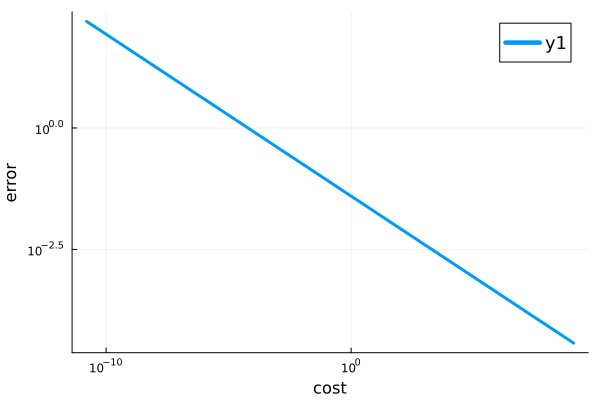

In [40]:
cost = kg_CO2
plot(cost, error, xlabel="cost", ylabel="error", xscale=:log10, yscale=:log10)

* [Barrel of oil equivalent](https://en.wikipedia.org/wiki/Barrel_of_oil_equivalent)
* [Electricity emission factor](https://www.epa.gov/energy/greenhouse-gases-equivalencies-calculator-calculations-and-references)

# Outlook on sparse direct solvers

* Sparse direct works well for 2D and almost-2D problems to medium large sizes
  * High order FD methods make sparse direct cry
  * High order finite element are okay, but [not high-continuity splines](https://doi.org/10.1016/j.cma.2011.11.002)
  * Almost-2D includes a lot of industrial solid mechanics applications
    * The body of a car, the frame of an airplane
* Sparse direct is rarely usable in "fully 3D" problems
  * "thick" structures
    * soil mechanics, hydrology, building foundations, bones, tires
  * fluid mechanics
    * aerodynamics, heating/cooling systems, atmosphere/ocean
* Setup cost (factorization) is much more expensive than solve
  * Amortize cost in time-dependent problems
    * Rosenbrock methods: factorization reused across stages
    * "lag" Jacobian in Newton (results in "modified Newton")
    * "lag" preconditioner with matrix-free iterative methods (Sundials, PETSc)
  * Factorization pays off if you have many right hand sides

# Krylov subspaces

All matrix iterations work with approximations in a *Krylov subspace*, which has the form

$$ K_n = \big[ b \big| Ab \big| A^2 b \big| \dotsm \big| A^{n-1} b \big] . $$

This matrix is horribly ill-conditioned and cannot stably be computed as written.  Instead, we seek an orthogonal basis $Q_n$ that spans the same space as $K_n$.  We could write this as a factorization

$$ K_n = Q_n R_n $$

where the first column $q_0 = b / \lVert b \rVert$.  The $R_n$ is unnecessary and hopelessly ill-conditioned, so a slightly different procedure is used.



## GMRES
$$ A Q_n = Q_{n+1} H_n $$

GMRES (Generalized Minimum Residual) minimizes
$$ \lVert A x - b \rVert $$
over the subspace $Q_n$.  I.e., $x = Q_n y$ for some $y$.  By the Arnoldi recurrence, this is equivalent to
$$ \lVert Q_{n+1} H_n y - b \lVert $$
which can be solved by minimizing
$$ \lVert H_n y - Q_{n+1}^* b \rVert . $$
Since $q_0 = b/\lVert b \lVert$, the least squares problem is to minimize
$$ \Big\lVert H_n y - \lVert b \rVert e_0 \Big\rVert . $$
The solution of this least squares problem is achieved by incrementally updating a $QR$ factorization of $H_n$.

# Preconditioning

For most problems where you want to use implicit methods, Krylov methods converge very slow on their own. Preconditioning provides an operation $"P^{-1}"$ that improves conditioning of the product $P^{-1} A$.

$$ P^{-1} A x = P^{-1} b$$

# Simple preconditioners

## Jacobi `-pc_type jacobi`

$$ P_{\text{Jacobi}}^{-1} = D^{-1} $$
where $D$ is the diagonal of $A$.

## Gauss-Seidel `-pc_type sor`

$$ P_{GS}^{-1} = (L+D)^{-1} $$
where $L$ is the (strictly) lower triangular part of $A$.  The upper triangular part may be used instead, or a symmetric form
$$ P_{SGS}^{-1} = (L+U)^{-1} A \Big( I - (L+D)^{-1} \Big) . $$

### Over-relaxation

`-pc_sor_omega 1.` is default (Gauss-Seidel)

## Run p-Laplacian example
```console
$ cd src/snes/tutorials
$ make ex15
$ ./ex15 -da_refine 2 -dm_view
$ ./ex15 -ksp_monitor -pc_type jacobi
$ mpiexec -n 2 ./ex15 -snes_view
```

## Experiments

* How does iteration count vary under grid refinement?
* How sensitive is it to parameters
  * p-Laplacian `-p` $> 1$ and `-epsilon` $> 0$
  * Bratu `-lambda` $< 6.8$
* How sensitive to `-ksp_gmres_restart`?
* `-ksp_monitor_true_residual`
* `-ksp_view_eigenvalues`

# PETSc experiments

* Compare domain decomposition and multigrid preconditioning
 * `-pc_type asm` (Additive Schwarz)
  * `-pc_asm_type basic` (symmetric, versus `restrict`)
  * `-pc_asm_overlap 2` (increase overlap)
  * Effect of direct subdomain solver: `-sub_pc_type lu`

* Symmetric example: `src/snes/examples/tutorials/ex5.c`
* Nonsymmetric example: `src/snes/examples/tutorials/ex19.c`
* Compare preconditioned versus unpreconditioned norms.
* Compare BiCG versus GMRES
 * `-pc_type mg` (Geometric Multigrid)
* Use monitors:
 * `-ksp_monitor_true_residual`
 * `-ksp_monitor_singular_value`
 * `-ksp_converged_reason`
* Explain methods: `-snes_view`
* Performance info: `-log_view`

# [CEED-Fluids](https://libceed.org/en/latest/examples/fluids/)

Stabilized finite element methods for compressible Navier-Stokes with GPU support.
```console
$ git clone https://github.com/CEED/libCEED
$ cd libCEED/examples/fluids
$ ceed-fluids -options_file gaussianwave.yaml -ts_monitor -snes_monitor
```

<video src="img/ROPI_OutView.webm" autoplay loop width="80%" />

Add `-ts_monitor_solution cgns:s.cgns` to visualize with Paraview.

<video src="img/w-sfc-per-q3.webm" autoplay loop />

# [Ratel solid mechanics](https://ratel.micromorph.org/)

```
$ git clone https://gitlab.com/micromorph/ratel
$ cd ratel
$ ratel-quasistatic -options_file examples/ex02-quasistatic-elasticity-neo-hookean-current-platen-half-cylinder.yml
```

<video src="img/cylinder-contact.webm" autoplay loop />

<video src="img/schwarz-pendulum.webm" autoplay loop width="60%" />

<video src="img/schwarz-q2-5x5x5-t20-l2-r2.webm" autoplay loop width="60%" />

# Approximation constants are good for high order

<img src="img/accuracy_study_annotated.svg" width="90%" />

<video src="img/one-hole-traction-20220222.webm" autoplay controls loop />

# Bandwidth is scarce compared to flops

<img src="img/flop-per-byte-dp-2022.svg" width="90%" class="center" />

# Why matrix-free?
* Assembled matrices need at least 4 bytes transferred per flop. Hardware does 10 flops/byte. Matrix-free methods store and move less data, compute faster.

<img src="img/TensorVsAssembly-qstore.svg" width="90%" class="center" />

# Matrix-free is already faster for $Q_1$ elements

<img src="img/schwarz-apply.svg" width="95%" />